### Connecting Pytorch Metal

In [26]:
import torch
if torch.backends.mps.is_available():
    mps_device = torch.device("mps")
    x = torch.ones(1, device=mps_device)
    print(x)
else:
    print("MPS device not found.")

MPS device not found.


### Importing Libraries

In [1]:
import torch
import os
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import torch.optim as optim
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

### Loading the data

In [2]:
data = pd.read_table('data/u.data')
data.head()

,user,event,rating,timestamp
0,196,242,3,881250949
1,186,302,3,891717742
2,22,377,1,878887116
3,244,51,2,880606923
4,166,346,1,886397596


### Pre-processing the data

In [3]:
users = data['user'].unique()
events = data['event'].unique()

events[:10], users[:10]

(array([242, 302, 377,  51, 346, 474, 265, 465, 451,  86]),
 array([196, 186,  22, 244, 166, 298, 115, 253, 305,   6]))

In [4]:
user_to_idx = {user: idx for idx, user in enumerate(users)}
event_to_idx = {event: idx for idx, event in enumerate(events)}
idx_to_user = {idx: user for user,
               idx in user_to_idx.items()}  # For reverse lookup
idx_to_event = {idx: event for event,
                idx in event_to_idx.items()}  # For reverse lookup

for key, value in user_to_idx.items():
    if value == 0:
        print(f'User: {key}, assigned index: {value}')

for key, value in event_to_idx.items():
    if value == 0:
        print(f'Event: {key}, assigned index: {value}')

User: 196, assigned index: 0
Event: 242, assigned index: 0


In [5]:
data['user_idx'] = data['user'].map(user_to_idx)
data['event_idx'] = data['event'].map(event_to_idx)

data.head()

,user,event,rating,timestamp,user_idx,event_idx
0,196,242,3,881250949,0,0
1,186,302,3,891717742,1,1
2,22,377,1,878887116,2,2
3,244,51,2,880606923,3,3
4,166,346,1,886397596,4,4


In [32]:
train_data, test_data = train_test_split(
    data, test_size=0.2, random_state=21, shuffle=True)
train_data, val_data = train_test_split(
    train_data, test_size=0.25, random_state=21, shuffle=True)
len(train_data), len(val_data), len(test_data)

(60000, 20000, 20000)

In [33]:
train_dataloader = DataLoader(
    train_data[['user_idx', 'event_idx', 'rating']].values, batch_size=64, shuffle=False)
val_dataloader = DataLoader(
    val_data[['user_idx', 'event_idx', 'rating']].values, batch_size=64, shuffle=False)
test_dataloader = DataLoader(
    test_data[['user_idx', 'event_idx', 'rating']].values, batch_size=1, shuffle=False)

In [34]:
for batch in train_dataloader:
    print('Example batch: ', batch[:10])
    print()
    print('Len of a batch: ', len(batch))
    break

Example batch:  tensor([[ 521,  995,    5],
        [ 752,  403,    2],
        [ 261,  223,    3],
        [ 339,  452,    4],
        [ 684,  357,    4],
        [ 181,  405,    2],
        [ 797,  538,    4],
        [ 243, 1196,    5],
        [ 550,  511,    4],
        [  85,  456,    3]])

Len of a batch:  64


### CNN Feature Extractor

In [35]:
class CNN_FeatureExtractor(nn.Module):
    def __init__(self, input_channels, embedding_dim, output_dim):
        super(CNN_FeatureExtractor, self).__init__()
        self.conv1 = nn.Conv1d(input_channels, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv1d(32, 64, kernel_size=3, padding=1)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.fc = nn.Linear(64, output_dim)

    def forward(self, x):
        # print(f"CNN input shape: {x.shape}")
        x = F.relu(self.conv1(x))
        # print(f"After conv1: {x.shape}")
        # x = self.pool(x)
        # print(f"After pool1: {x.shape}")
        x = F.relu(self.conv2(x))
        # print(f"After conv2: {x.shape}")
        x = self.pool(x)
        # print(f"After pool2: {x.shape}")
        x = x.view(x.size(0), -1)
        # print(f"After flatten: {x.shape}")
        x = self.fc(x)
        # print(f"CNN output shape: {x.shape}")
        return x

### NCF with CNN

In [36]:
class NCF_with_CNN(nn.Module):
    def __init__(self, num_users, num_items, embedding_dim=96, hidden_dim=64, cnn_output_dim=32, dropout_rate=0.5):
        super(NCF_with_CNN, self).__init__()

        self.user_embedding = nn.Embedding(num_users, embedding_dim)
        self.item_embedding = nn.Embedding(num_items, embedding_dim)

        self.user_cnn = CNN_FeatureExtractor(1, embedding_dim, cnn_output_dim)
        self.item_cnn = CNN_FeatureExtractor(1, embedding_dim, cnn_output_dim)

        self.fc1 = nn.Linear(cnn_output_dim * 2, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, 1)
        self.dropout = nn.Dropout(dropout_rate)

    def forward(self, user, item):
        user_emb = self.user_embedding(user)
        item_emb = self.item_embedding(item)

        user_features = self.user_cnn(user_emb.unsqueeze(1))
        item_features = self.item_cnn(item_emb.unsqueeze(1))

        x = torch.cat([user_features, item_features], dim=1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

In [37]:
class EarlyStopper:
    def __init__(self, patience=1, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = float('inf')

    def early_stop(self, validation_loss):
        if validation_loss < self.min_validation_loss:
            self.min_validation_loss = validation_loss
            self.counter = 0
        elif validation_loss > (self.min_validation_loss + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

In [38]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')
device = torch.device('cuda') if torch.cuda.is_available() else device
num_users = len(users)
num_items = len(events)
embedding_dim = 96
cnn_output_dim = 32
hidden_dim = 64
model = NCF_with_CNN(num_users, num_items,
                     cnn_output_dim=cnn_output_dim).to(device)
num_epochs = 10
lr = 1e-3
# optimizer = optim.Adam(model.parameters(), lr=lr)
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)

scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.1, patience=3, verbose=True)

criterion = nn.MSELoss()
early_stopper = EarlyStopper(patience=3, min_delta=0.0001)

/home/tanmaypatil/Documents/DS/hybrid-recommendation-system/.venv/lib64/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [39]:
def calculate_metrics(predictions, targets):
    mae = nn.L1Loss()(predictions, targets).item()
    mse = nn.MSELoss()(predictions, targets).item()
    rmse = np.sqrt(mse)
    return mae, rmse

### Training

In [40]:
def train(model, train_dataloader, val_dataloader, optimizer, scheduler, criterion, device, num_epochs=30):
    model.train()
    train_losses, val_losses = [], []
    train_maes, val_maes = [], []
    train_rmses, val_rmses = [], []

    for epoch in range(num_epochs):
        total_loss, total_mae, total_rmse = 0, 0, 0
        model.train()

        for batch in train_dataloader:
            user, event, target = batch[:, 0].to(device), batch[:, 1].to(
                device), batch[:, 2].float().to(device)
            optimizer.zero_grad()
            output = model(user, event).squeeze()
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            mae, rmse = calculate_metrics(output, target)
            total_mae += mae
            total_rmse += rmse

        avg_train_loss = total_loss / len(train_dataloader)
        avg_train_mae = total_mae / len(train_dataloader)
        avg_train_rmse = total_rmse / len(train_dataloader)
        train_losses.append(avg_train_loss)
        train_maes.append(avg_train_mae)
        train_rmses.append(avg_train_rmse)

        # Validation phase
        model.eval()
        val_loss, val_mae, val_rmse = 0, 0, 0
        with torch.no_grad():
            for batch in val_dataloader:
                user, event, target = batch[:, 0].to(device), batch[:, 1].to(
                    device), batch[:, 2].float().to(device)
                output = model(user, event).squeeze()
                val_loss += criterion(output, target).item()
                mae, rmse = calculate_metrics(output, target)
                val_mae += mae
                val_rmse += rmse

        avg_val_loss = val_loss / len(val_dataloader)
        avg_val_mae = val_mae / len(val_dataloader)
        avg_val_rmse = val_rmse / len(val_dataloader)
        val_losses.append(avg_val_loss)
        val_maes.append(avg_val_mae)
        val_rmses.append(avg_val_rmse)

        # Learning rate scheduling
        scheduler.step(avg_val_loss)
        if early_stopper.early_stop(avg_val_rmse):
            return train_losses, val_losses, train_maes, val_maes, train_rmses, val_rmses

        print(f'Epoch: {epoch+1}/{num_epochs}, '
              f'Train Loss: {avg_train_loss:.4f}, Train MAE: {
                  avg_train_mae:.4f}, Train RMSE: {avg_train_rmse:.4f}, '
              f'Val Loss: {avg_val_loss:.4f}, Val MAE: {avg_val_mae:.4f}, Val RMSE: {avg_val_rmse:.4f}')

    return train_losses, val_losses, train_maes, val_maes, train_rmses, val_rmses

In [41]:
train_losses, val_losses, train_maes, val_maes, train_rmses, val_rmses = train(
    model, train_dataloader, val_dataloader, optimizer, scheduler, criterion, device, num_epochs=30
)

Epoch: 1/30, Train Loss: 1.8630, Train MAE: 1.0919, Train RMSE: 1.3310, Val Loss: 1.1308, Val MAE: 0.8571, Val RMSE: 1.0599
Epoch: 2/30, Train Loss: 1.3766, Train MAE: 0.9451, Train RMSE: 1.1686, Val Loss: 0.9511, Val MAE: 0.7837, Val RMSE: 0.9721
Epoch: 3/30, Train Loss: 1.1990, Train MAE: 0.8794, Train RMSE: 1.0906, Val Loss: 0.9109, Val MAE: 0.7574, Val RMSE: 0.9507
Epoch: 4/30, Train Loss: 1.1051, Train MAE: 0.8421, Train RMSE: 1.0469, Val Loss: 0.9076, Val MAE: 0.7515, Val RMSE: 0.9486
Epoch: 5/30, Train Loss: 1.0528, Train MAE: 0.8214, Train RMSE: 1.0219, Val Loss: 0.9244, Val MAE: 0.7721, Val RMSE: 0.9580
Epoch: 6/30, Train Loss: 1.0012, Train MAE: 0.7996, Train RMSE: 0.9963, Val Loss: 0.9074, Val MAE: 0.7556, Val RMSE: 0.9486
Epoch: 7/30, Train Loss: 0.9636, Train MAE: 0.7834, Train RMSE: 0.9774, Val Loss: 0.9096, Val MAE: 0.7599, Val RMSE: 0.9499
Epoch: 8/30, Train Loss: 0.9428, Train MAE: 0.7755, Train RMSE: 0.9669, Val Loss: 0.9046, Val MAE: 0.7524, Val RMSE: 0.9470
Epoch: 9

### Plotting

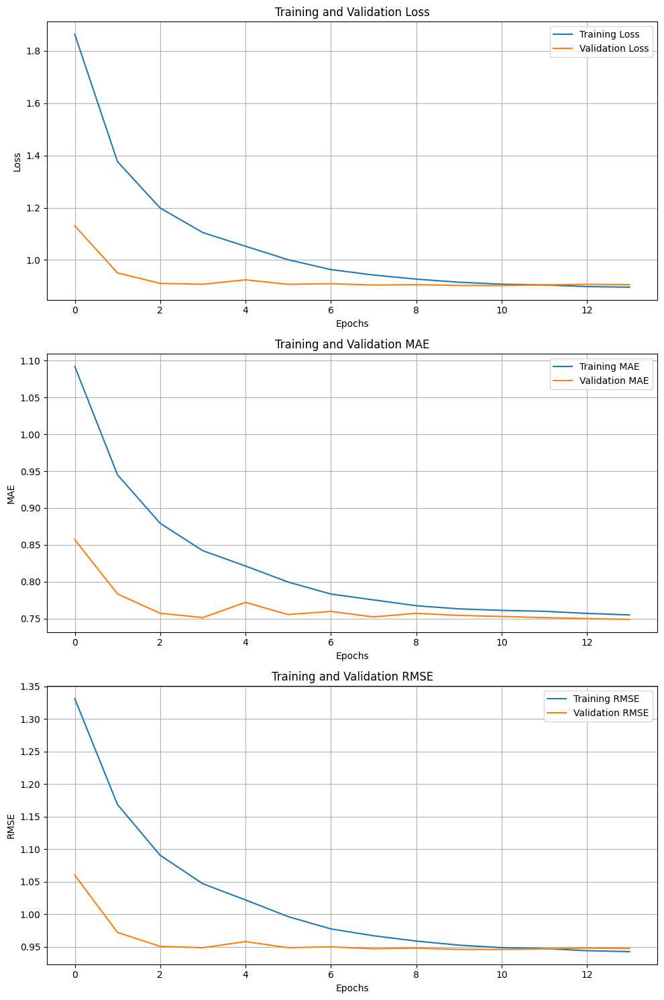

In [42]:
# Plotting
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 15))

# Loss plot
ax1.plot(train_losses, label='Training Loss')
ax1.plot(val_losses, label='Validation Loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.set_title('Training and Validation Loss')
ax1.legend()
ax1.grid(True)

# MAE plot
ax2.plot(train_maes, label='Training MAE')
ax2.plot(val_maes, label='Validation MAE')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('MAE')
ax2.set_title('Training and Validation MAE')
ax2.legend()
ax2.grid(True)

# RMSE plot
ax3.plot(train_rmses, label='Training RMSE')
ax3.plot(val_rmses, label='Validation RMSE')
ax3.set_xlabel('Epochs')
ax3.set_ylabel('RMSE')
ax3.set_title('Training and Validation RMSE')
ax3.legend()
ax3.grid(True)

plt.tight_layout()
plt.show()

In [43]:
sample = [808, 881]
user = torch.tensor([user_to_idx[sample[0]]]).to(device)
event = torch.tensor([event_to_idx[sample[1]]]).to(device)
model.eval()
model(user, event)

tensor([[3.8012]], device='cuda:0', grad_fn=<AddmmBackward0>)

In [44]:
def evaluate(model, dataloader, device):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for batch in dataloader:
            user, event, target = batch[:, 0].to(device), batch[:, 1].to(
                device), batch[:, 2].float().to(device)
            print(user, event)
            output = model(user, event).squeeze()
            loss = criterion(output, target)
            total_loss += loss.item()
    return total_loss / len(dataloader)

In [45]:
evaluate(model, test_dataloader, device)

tensor([582], device='cuda:0') tensor([181], device='cuda:0')
tensor([442], device='cuda:0') tensor([890], device='cuda:0')
tensor([58], device='cuda:0') tensor([299], device='cuda:0')
tensor([233], device='cuda:0') tensor([1013], device='cuda:0')
tensor([507], device='cuda:0') tensor([104], device='cuda:0')
tensor([292], device='cuda:0') tensor([666], device='cuda:0')
tensor([18], device='cuda:0') tensor([453], device='cuda:0')
tensor([902], device='cuda:0') tensor([578], device='cuda:0')
tensor([86], device='cuda:0') tensor([89], device='cuda:0')
tensor([409], device='cuda:0') tensor([659], device='cuda:0')
tensor([387], device='cuda:0') tensor([40], device='cuda:0')
tensor([40], device='cuda:0') tensor([4], device='cuda:0')
tensor([837], device='cuda:0') tensor([657], device='cuda:0')
tensor([865], device='cuda:0') tensor([695], device='cuda:0')
tensor([348], device='cuda:0') tensor([702], device='cuda:0')
tensor([593], device='cuda:0') tensor([68], device='cuda:0')
tensor([887], de

/home/tanmaypatil/Documents/DS/hybrid-recommendation-system/.venv/lib64/python3.12/site-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


tensor([819], device='cuda:0') tensor([161], device='cuda:0')
tensor([494], device='cuda:0') tensor([56], device='cuda:0')
tensor([584], device='cuda:0') tensor([595], device='cuda:0')
tensor([11], device='cuda:0') tensor([216], device='cuda:0')
tensor([324], device='cuda:0') tensor([985], device='cuda:0')
tensor([54], device='cuda:0') tensor([53], device='cuda:0')
tensor([501], device='cuda:0') tensor([151], device='cuda:0')
tensor([500], device='cuda:0') tensor([175], device='cuda:0')
tensor([479], device='cuda:0') tensor([53], device='cuda:0')
tensor([405], device='cuda:0') tensor([145], device='cuda:0')
tensor([75], device='cuda:0') tensor([485], device='cuda:0')
tensor([892], device='cuda:0') tensor([736], device='cuda:0')
tensor([481], device='cuda:0') tensor([273], device='cuda:0')
tensor([311], device='cuda:0') tensor([801], device='cuda:0')
tensor([402], device='cuda:0') tensor([226], device='cuda:0')
tensor([369], device='cuda:0') tensor([682], device='cuda:0')
tensor([58], d

0.8987851046586608

## Saving the Model

In [46]:
# model_scripted = torch.jit.script(model)
# model_scripted.save(os.path.join('models', 'NCF_CNN.pt'))

## Load Model

In [6]:
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')
device = torch.device('cuda') if torch.cuda.is_available() else device

In [7]:
model = torch.jit.load('models/NCF_CNN.pt').to(device)

In [8]:
model(torch.tensor([582]).to(device), torch.tensor([171]).to(device))

tensor([[3.1027]], device='cuda:0', grad_fn=<AddmmBackward0>)

In [9]:
data[(data['user_idx'] == 582) & (data['event_idx'] == 34)]

,user,event,rating,timestamp,user_idx,event_idx
91392,591,194,4,891031171,582,34


In [10]:
user_582 = data[data['user_idx'] == 582]['event_idx'].to_list()

In [11]:
event_idx = np.arange(0, 1682, 1)

In [53]:
not_watched = []
for event in event_idx:
    if not len(data[(data['user_idx'] == 582) & (data['event_idx'] == event)]['event_idx'].to_list()):
        not_watched.append(event)
    else:
        print(f'Already Wacthed {event}')

Already Wacthed 8
Already Wacthed 9
Already Wacthed 33
Already Wacthed 34
Already Wacthed 36
Already Wacthed 47
Already Wacthed 49
Already Wacthed 51
Already Wacthed 53
Already Wacthed 64
Already Wacthed 77
Already Wacthed 86
Already Wacthed 89
Already Wacthed 92
Already Wacthed 108
Already Wacthed 132
Already Wacthed 138
Already Wacthed 156
Already Wacthed 161
Already Wacthed 166
Already Wacthed 170
Already Wacthed 179
Already Wacthed 181
Already Wacthed 189
Already Wacthed 196
Already Wacthed 216
Already Wacthed 226
Already Wacthed 239
Already Wacthed 240
Already Wacthed 242
Already Wacthed 247
Already Wacthed 254
Already Wacthed 264
Already Wacthed 276
Already Wacthed 287
Already Wacthed 289
Already Wacthed 291
Already Wacthed 329
Already Wacthed 337
Already Wacthed 342
Already Wacthed 347
Already Wacthed 356
Already Wacthed 362
Already Wacthed 363
Already Wacthed 366
Already Wacthed 367
Already Wacthed 377
Already Wacthed 380
Already Wacthed 389
Already Wacthed 407
Already Wacthed 

In [54]:
list_ratings = []
for movie in not_watched:
    model.eval()
    rating = model(torch.tensor([582]).to(device),
                   torch.tensor([movie]).to(device))

    list_ratings.append([user.item(), int(movie), rating.item()])

In [55]:
sorted(list_ratings, key=lambda x: x[2], reverse=True)[:10]

[[824, 180, 4.520999908447266],
 [824, 174, 4.48397159576416],
 [824, 78, 4.429022789001465],
 [824, 200, 4.381152629852295],
 [824, 612, 4.329455375671387],
 [824, 185, 4.297791481018066],
 [824, 125, 4.265270709991455],
 [824, 277, 4.260311603546143],
 [824, 357, 4.228402137756348],
 [824, 611, 4.191744804382324]]

In [12]:
def get_recommendations(user_id, data, model, k=10):
    model.eval()
    not_watched = []
    list_ratings = []
    events = [8, 9, 33, 34, 410, 254]
    event_idx = np.arange(
        np.min(data['event_idx']), np.max(data['event_idx'])+1, 1)
    for event in event_idx:
        if (not len(data[(data['user_idx'] == user_id) & (data['event_idx'] == event)]['event_idx'].to_list())) or event in events:
            not_watched.append(event)
        else:
            print(f'Already Wacthed {event}')
    for movie in not_watched:
        rating = model(torch.tensor([user_id]).to(device),
                       torch.tensor([movie]).to(device))

        list_ratings.append([user_id, int(movie), rating.item()])
    recommendations = sorted(
        list_ratings, key=lambda x: x[2], reverse=True)
    return recommendations

In [13]:
get_recommendations(582, data=data, model=model)

Already Wacthed 36
Already Wacthed 47
Already Wacthed 49
Already Wacthed 51
Already Wacthed 53
Already Wacthed 64
Already Wacthed 77
Already Wacthed 86
Already Wacthed 89
Already Wacthed 92
Already Wacthed 108
Already Wacthed 132
Already Wacthed 138
Already Wacthed 156
Already Wacthed 161
Already Wacthed 166
Already Wacthed 170
Already Wacthed 179
Already Wacthed 181
Already Wacthed 189
Already Wacthed 196
Already Wacthed 216
Already Wacthed 226
Already Wacthed 239
Already Wacthed 240
Already Wacthed 242
Already Wacthed 247
Already Wacthed 264
Already Wacthed 276
Already Wacthed 287
Already Wacthed 289
Already Wacthed 291
Already Wacthed 329
Already Wacthed 337
Already Wacthed 342
Already Wacthed 347
Already Wacthed 356
Already Wacthed 362
Already Wacthed 363
Already Wacthed 366
Already Wacthed 367
Already Wacthed 377
Already Wacthed 380
Already Wacthed 389
Already Wacthed 407
Already Wacthed 423
Already Wacthed 431
Already Wacthed 432
Already Wacthed 445
Already Wacthed 485
Already Wa

[[582, 180, 4.520999908447266],
 [582, 174, 4.48397159576416],
 [582, 78, 4.429022789001465],
 [582, 200, 4.381152629852295],
 [582, 612, 4.329455375671387],
 [582, 185, 4.297791481018066],
 [582, 125, 4.265270709991455],
 [582, 277, 4.260311603546143],
 [582, 357, 4.228402137756348],
 [582, 611, 4.191744804382324],
 [582, 482, 4.186901569366455],
 [582, 297, 4.166268348693848],
 [582, 130, 4.163813591003418],
 [582, 697, 4.152057647705078],
 [582, 5, 4.14716100692749],
 [582, 31, 4.143257141113281],
 [582, 629, 4.122641086578369],
 [582, 1255, 4.11646842956543],
 [582, 496, 4.11227560043335],
 [582, 45, 4.10503625869751],
 [582, 260, 4.103616714477539],
 [582, 1, 4.099749565124512],
 [582, 541, 4.098720073699951],
 [582, 660, 4.086790084838867],
 [582, 630, 4.078560829162598],
 [582, 275, 4.066203594207764],
 [582, 723, 4.064932346343994],
 [582, 1047, 4.064574241638184],
 [582, 321, 4.059607982635498],
 [582, 753, 4.059441089630127],
 [582, 91, 4.058900833129883],
 [582, 58, 4.053495

In [14]:
import torch


def precision_at_k(model, data, k=10, device='cpu', rating_threshold=3.0):
    model.eval()

    unique_users = data['user_idx'].unique()
    precisions = []

    for user_id in unique_users:
        # Get items the user rated as relevant (above the threshold)
        relevant_data = data[(data['user_idx'] == user_id) & (
            data['rating'] >= rating_threshold)]
        relevant_events = set(relevant_data['event_idx'])

        # Get the user's interacted items (both relevant and non-relevant)
        interacted_events = set(data[data['user_idx'] == user_id]['event_idx'])

        # We skip users with no relevant items
        if not relevant_events:
            continue

        # Candidate events include all events except the ones user rated below the threshold
        candidate_events = list(
            set(data['event_idx'].unique()) - (interacted_events - relevant_events))

        user_tensor = torch.tensor(
            [user_id] * len(candidate_events)).to(device)
        event_tensor = torch.tensor(candidate_events).to(device)

        with torch.no_grad():
            predictions = model(user_tensor, event_tensor).squeeze()

        # Get top K recommendations
        top_k_indices = torch.topk(predictions, k).indices
        top_k_events = [candidate_events[idx] for idx in top_k_indices]

        # Calculate Precision@K
        num_relevant_in_top_k = sum(
            [1 for event in top_k_events if event in relevant_events])
        precision = num_relevant_in_top_k / k
        precisions.append(precision)

    # Average Precision@K across all users
    mean_precision_at_k = sum(precisions) / \
        len(precisions) if precisions else 0
    return mean_precision_at_k

In [15]:
import numpy as np


def ndcg_at_k(model, data, k=10, device='cpu', rating_threshold=4.0):
    model.eval()

    unique_users = data['user_idx'].unique()
    ndcgs = []

    for user_id in unique_users:
        # Get items the user rated as relevant (above the threshold)
        relevant_data = data[(data['user_idx'] == user_id) & (
            data['rating'] >= rating_threshold)]
        relevant_events = set(relevant_data['event_idx'])

        # Get the user's interacted items (both relevant and non-relevant)
        interacted_events = set(data[data['user_idx'] == user_id]['event_idx'])

        # We skip users with no relevant items
        if not relevant_events:
            continue

        # Candidate events include all events except those the user rated below the threshold
        candidate_events = list(
            set(data['event_idx'].unique()) - (interacted_events - relevant_events))

        user_tensor = torch.tensor(
            [user_id] * len(candidate_events)).to(device)
        event_tensor = torch.tensor(candidate_events).to(device)

        with torch.no_grad():
            predictions = model(user_tensor, event_tensor).squeeze()

        # Get top K recommendations
        top_k_indices = torch.topk(predictions, k).indices
        top_k_events = [candidate_events[idx] for idx in top_k_indices]

        # Calculate DCG
        dcg = 0
        for i, event in enumerate(top_k_events):
            if event in relevant_events:
                # Adding 1 to i to convert 0-indexed to 1-indexed
                dcg += 1 / np.log2(i + 2)

        # Calculate IDCG (Ideal DCG)
        ideal_relevances = [1 / np.log2(i + 2)
                            for i in range(min(len(relevant_events), k))]
        idcg = sum(ideal_relevances)

        # NDCG Calculation
        ndcg = dcg / idcg if idcg > 0 else 0
        ndcgs.append(ndcg)

    # Average NDCG across all users
    mean_ndcg_at_k = sum(ndcgs) / len(ndcgs) if ndcgs else 0
    return mean_ndcg_at_k

In [16]:
from sklearn.metrics import r2_score


def r2_score_model(model, data, device='cpu', rating_threshold=4.0):
    model.eval()

    # Predictions and true values
    with torch.no_grad():
        y_true = []
        y_pred = []

        for user_id in data['user_idx'].unique():
            user_data = data[data['user_idx'] == user_id]

            # Get items the user rated as relevant (above the threshold)
            relevant_data = user_data[user_data['rating'] >= rating_threshold]

            if relevant_data.empty:
                continue

            # Get all items to predict ratings for
            user_tensor = torch.tensor(
                user_data['user_idx'].to_list()).to(device)
            event_tensor = torch.tensor(
                user_data['event_idx'].to_list()).to(device)

            with torch.no_grad():
                predictions = model(user_tensor, event_tensor).squeeze()

            y_true.extend(user_data['rating'].tolist())
            y_pred.extend(predictions.cpu().numpy().tolist())

        return r2_score(y_true, y_pred)

In [17]:
def recall_at_k(model, data, k=10, device='cpu', rating_threshold=4.0):
    model.eval()

    unique_users = data['user_idx'].unique()
    recalls = []

    for user_id in unique_users:
        # Get items the user rated as relevant (above the threshold)
        relevant_data = data[(data['user_idx'] == user_id) & (
            data['rating'] >= rating_threshold)]
        relevant_events = set(relevant_data['event_idx'])

        # Get the user's interacted items (both relevant and non-relevant)
        interacted_events = set(data[data['user_idx'] == user_id]['event_idx'])

        # We skip users with no relevant items
        if not relevant_events:
            continue

        # Candidate events include all events except those rated below the threshold
        candidate_events = list(
            set(data['event_idx'].unique()) - (interacted_events - relevant_events))

        user_tensor = torch.tensor(
            [user_id] * len(candidate_events)).to(device)
        event_tensor = torch.tensor(candidate_events).to(device)

        with torch.no_grad():
            predictions = model(user_tensor, event_tensor).squeeze()

        # Get top K recommendations
        top_k_indices = torch.topk(predictions, k).indices
        top_k_events = [candidate_events[idx] for idx in top_k_indices]

        # Calculate Recall@K
        num_relevant_in_top_k = sum(
            [1 for event in top_k_events if event in relevant_events])
        recall = num_relevant_in_top_k / \
            len(relevant_events) if relevant_events else 0
        recalls.append(recall)

    # Average Recall@K across all users
    mean_recall_at_k = sum(recalls) / len(recalls) if recalls else 0
    return mean_recall_at_k

In [18]:
# Assuming the model and data are already defined, as in your code
recall_k = precision_at_k(model, data, k=5, device=device)
print(f"Precision@10: {recall_k:.4f}")

Precision@10: 0.1881


In [19]:
mean_ndcg_at_k = ndcg_at_k(
    model, data, k=10, device=device, rating_threshold=3.0)
print(f"NDCG@10: {mean_ndcg_at_k:.4f}")

NDCG@10: 0.1886


In [20]:
mean_r2 = r2_score_model(model, data, device=device)
print("R² Score:", mean_r2)

R² Score: 0.31626215727095586


In [21]:
recall_k = precision_at_k(model, data, k=5, device=device)
print(f"Recall@10: {recall_k:.4f}")

Recall@10: 0.1881


In [22]:
for k in [1, 5, 10, 15, 20, 25, 40, 50]:
    recall_k = precision_at_k(model, data, k, device=device)
    print(f"Precision@{k}: {recall_k:.4f}")

Precision@1: 0.1166
Precision@5: 0.1881
Precision@10: 0.1966
Precision@15: 0.2105
Precision@20: 0.2169
Precision@25: 0.2134
Precision@40: 0.1974
Precision@50: 0.1909


In [24]:
import torch
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math


def test_recommendation_system(model, data, user_samples=10, k=10, device='cpu'):
    """
    Comprehensive test suite for recommendation system using functional approach
    Returns a dictionary with all metrics
    """
    # Sample users for testing if dataset is large
    unique_users = data['user_idx'].unique()
    test_users = np.random.choice(unique_users, min(
        user_samples, len(unique_users)), replace=False)

    metrics = {}

    # Test basic recommendation generation
    sample_user = test_users[0]
    recommendations = get_recommendations(sample_user, data, model, k)
    metrics['sample_recommendations'] = recommendations[:k]

    # Calculate traditional metrics
    metrics['precision@k'] = precision_at_k(model, data, k, device)
    metrics['recall@k'] = recall_at_k(model, data, k, device)
    metrics['ndcg@k'] = ndcg_at_k(model, data, k, device)
    metrics['r2_score'] = r2_score_model(model, data, device)

    # Additional metrics
    metrics['mse'] = calculate_mse(model, data, device)
    metrics['rmse'] = calculate_rmse(model, data, device)
    metrics['mae'] = calculate_mae(model, data, device)
    metrics['novelty'] = calculate_novelty(model, data, k, device)
    metrics['personalization'] = calculate_personalization(
        model, data, test_users, k, device)
    metrics['long_tail_coverage'] = calculate_long_tail_coverage(
        model, data, k, device)
    metrics['item_coverage'] = calculate_item_coverage(
        model, data, test_users, k, device)
    metrics['user_coverage'] = calculate_user_coverage(model, data)

    return metrics


def calculate_mse(model, data, device='cpu'):
    """Calculate Mean Squared Error"""
    model.eval()
    with torch.no_grad():
        users = torch.tensor(data['user_idx'].values).to(device)
        items = torch.tensor(data['event_idx'].values).to(device)
        true_ratings = data['rating'].values
        predicted_ratings = model(users, items).cpu().numpy()
        return mean_squared_error(true_ratings, predicted_ratings)


def calculate_rmse(model, data, device='cpu'):
    """Calculate Root Mean Squared Error"""
    mse = calculate_mse(model, data, device)
    return math.sqrt(mse)


def calculate_mae(model, data, device='cpu'):
    """Calculate Mean Absolute Error"""
    model.eval()
    with torch.no_grad():
        users = torch.tensor(data['user_idx'].values).to(device)
        items = torch.tensor(data['event_idx'].values).to(device)
        true_ratings = data['rating'].values
        predicted_ratings = model(users, items).cpu().numpy()
        return mean_absolute_error(true_ratings, predicted_ratings)


def calculate_novelty(model, data, k=10, device='cpu'):
    """
    Calculate novelty of recommendations based on item popularity
    Lower values indicate more novel (less popular) recommendations
    """
    model.eval()

    # Calculate item popularity
    item_counts = data['event_idx'].value_counts()
    total_interactions = len(data)
    item_popularity = item_counts / total_interactions

    novelty_scores = []
    unique_users = data['user_idx'].unique()

    for user_id in unique_users:
        recommendations = get_recommendations(user_id, data, model, k)
        if recommendations:
            recommended_items = [rec[1] for rec in recommendations[:k]]
            # Calculate average popularity of recommended items
            items_novelty = [-np.log2(item_popularity.get(item, 1/total_interactions))
                             for item in recommended_items]
            novelty_scores.append(np.mean(items_novelty))

    return np.mean(novelty_scores) if novelty_scores else 0


def calculate_personalization(model, data, test_users, k=10, device='cpu'):
    """
    Calculate personalization as the average pairwise difference in recommendations
    Higher values indicate more personalized recommendations
    """
    user_recommendations = {}

    # Get recommendations for each user
    for user_id in test_users:
        recs = get_recommendations(user_id, data, model, k)
        if recs:
            user_recommendations[user_id] = set(rec[1] for rec in recs[:k])

    # Calculate pairwise differences
    total_diff = 0
    total_pairs = 0

    for user1 in user_recommendations:
        for user2 in user_recommendations:
            if user1 < user2:
                rec_set1 = user_recommendations[user1]
                rec_set2 = user_recommendations[user2]
                difference = 1 - len(rec_set1.intersection(rec_set2)) / k
                total_diff += difference
                total_pairs += 1

    return total_diff / total_pairs if total_pairs > 0 else 0


def calculate_long_tail_coverage(model, data, k=10, device='cpu', tail_percentage=0.8):
    """
    Calculate the coverage of long-tail items (less popular items)
    Returns the proportion of recommended items that are from the long tail
    """
    # Define long-tail items (e.g., items in the least popular 80%)
    item_counts = data['event_idx'].value_counts()
    sorted_items = item_counts.sort_values(ascending=False)
    n_head_items = int(len(sorted_items) * (1 - tail_percentage))
    long_tail_items = set(sorted_items.index[n_head_items:])

    unique_users = data['user_idx'].unique()
    long_tail_recs = 0
    total_recs = 0

    for user_id in unique_users:
        recommendations = get_recommendations(user_id, data, model, k)
        if recommendations:
            recommended_items = [rec[1] for rec in recommendations[:k]]
            long_tail_recs += sum(
                1 for item in recommended_items if item in long_tail_items)
            total_recs += len(recommended_items)

    return long_tail_recs / total_recs if total_recs > 0 else 0


def calculate_item_coverage(model, data, test_users, k=10, device='cpu'):
    """
    Calculate the percentage of items that appear in recommendations
    """
    all_items = set(data['event_idx'].unique())
    recommended_items = set()

    for user_id in test_users:
        recommendations = get_recommendations(user_id, data, model, k)
        if recommendations:
            recommended_items.update(rec[1] for rec in recommendations[:k])

    return len(recommended_items) / len(all_items)


def calculate_user_coverage(model, data):
    """
    Calculate the percentage of users who receive at least one recommendation
    """
    total_users = len(data['user_idx'].unique())
    users_with_recs = sum(1 for user in data['user_idx'].unique()
                          if len(get_recommendations(user, data, model, 1)) > 0)
    return users_with_recs / total_users


def print_metrics(metrics):
    """Pretty print all metrics"""
    print("\n=== Recommendation System Metrics ===\n")

    # Basic metrics
    print("Basic Performance Metrics:")
    print(f"Precision@K: {metrics['precision@k']:.4f}")
    print(f"Recall@K: {metrics['recall@k']:.4f}")
    print(f"NDCG@K: {metrics['ndcg@k']:.4f}")
    print(f"R² Score: {metrics['r2_score']:.4f}")

    # Error metrics
    print("\nError Metrics:")
    print(f"MSE: {metrics['mse']:.4f}")
    print(f"RMSE: {metrics['rmse']:.4f}")
    print(f"MAE: {metrics['mae']:.4f}")

    # Advanced metrics
    print("\nAdvanced Metrics:")
    print(f"Novelty Score: {metrics['novelty']:.4f}")
    print(f"Personalization Score: {metrics['personalization']:.4f}")
    print(f"Long-tail Coverage: {metrics['long_tail_coverage']:.4f}")
    print(f"Item Coverage: {metrics['item_coverage']:.4f}")
    print(f"User Coverage: {metrics['user_coverage']:.4f}")

    # Sample recommendations
    print("\nSample Recommendations for one user:")
    for i, rec in enumerate(metrics['sample_recommendations'], 1):
        print(f"Rank {i}: Item {rec[1]} (Score: {rec[2]:.4f})")


# Example usage:

# Initialize your model and data


# Run all tests and get metrics
metrics = test_recommendation_system(model, data, device='cuda')

# Print all metrics in a formatted way
print_metrics(metrics)

Already Wacthed 10
Already Wacthed 12
Already Wacthed 23
Already Wacthed 24
Already Wacthed 49
Already Wacthed 51
Already Wacthed 52
Already Wacthed 60
Already Wacthed 68
Already Wacthed 77
Already Wacthed 86
Already Wacthed 89
Already Wacthed 95
Already Wacthed 98
Already Wacthed 120
Already Wacthed 140
Already Wacthed 144
Already Wacthed 157
Already Wacthed 175
Already Wacthed 181
Already Wacthed 189
Already Wacthed 204
Already Wacthed 209
Already Wacthed 242
Already Wacthed 259
Already Wacthed 267
Already Wacthed 302
Already Wacthed 336
Already Wacthed 339
Already Wacthed 340
Already Wacthed 357
Already Wacthed 364
Already Wacthed 403
Already Wacthed 409
Already Wacthed 427
Already Wacthed 452
Already Wacthed 502
Already Wacthed 525
Already Wacthed 644
Already Wacthed 652
Already Wacthed 675
Already Wacthed 695
Already Wacthed 861
Already Wacthed 862
Already Wacthed 904
Already Wacthed 935
Already Wacthed 1076
Already Wacthed 0
Already Wacthed 10
Already Wacthed 83
Already Wacthed 8


## Recommendation System Metrics

Basic Performance Metrics:
- Precision@K: 0.1966
- Recall@K: 0.0292
- NDCG@K: 0.1802
- R² Score: 0.3163

Error Metrics:
- MSE: 0.8661
- RMSE: 0.9307
- MAE: 0.7413

Advanced Metrics:
- Novelty Score: 9.3451
- Personalization Score: 0.3222
- Long-tail Coverage: 0.1611
- Item Coverage: 0.0137
- User Coverage: 1.0000